# Sensitivity analysis of spatial weights

This notebooks computes the spatial autocorrelation of density differences using a number of different spatial weights definitions and compares the results.

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd
import seaborn as sns
import plotly.express as px
import numpy as np
from scipy import stats
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import lisa_cluster

from src import plotting_functions as plot_func
from src import evaluation_functions as eval_func

%run ../settings/yaml_variables.py
%run ../settings/df_styler.py
%run ../settings/plotting.py
%run ../settings/paths.py
%run ../settings/load_osmdata.py
%run ../settings/load_refdata.py

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/explore/segregation/network/network.py:15: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  warn(
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


OSM data loaded successfully!
Reference data loaded successfully!


## Spatial patterns in density differences

To compare the sensitivity to the definition of spatial weights for another variable, update the data, column and variable name + data subset in the cell below.

In [2]:
# Read extrinsic grid results
with open(compare_results_data_fp + f"grid_results_extrinsic.pickle", "rb") as fp:
    extrinsic_grid = pickle.load(fp)


col_names = ["edge_density_diff"]
variable_names = ["edge_density"]
filepaths = [compare_analysis_plots_fp + "morans_edge_dens_test.png"]

# Get subset without cells with neither OSM nor reference data
ex_grid_subset = extrinsic_grid.loc[
    (~extrinsic_grid.count_osm_edges.isna()) | (~extrinsic_grid.count_ref_edges.isna())
].copy()

# Compute spatial weights
w_k6 = eval_func.compute_spatial_weights(
    ex_grid_subset, "hex_id_osm", "knn", k=6
)  # using filler col for subset
w_k12 = eval_func.compute_spatial_weights(
    ex_grid_subset, "hex_id_osm", "knn", k=12
)  # using filler col for subset
w_k18 = eval_func.compute_spatial_weights(
    ex_grid_subset, "hex_id_osm", "knn", k=18
)  # using filler col for subset
dist_1000 = eval_func.compute_spatial_weights(
    ex_grid_subset, "hex_id_osm", "dist", dist=1000
)  # using filler col for subset
dist_2000 = eval_func.compute_spatial_weights(
    ex_grid_subset, "hex_id_osm", "dist", dist=2000
)  # using filler col for subset


all_weigths = {
    "k6": w_k6,
    "k12": w_k12,
    "k18": w_k18,
    "dist1000": dist_1000,
    "dist2000": dist_2000,
}


/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 23 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 7 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 5 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:167: UserWarning: There are 132 disconnected 

no valid type defined
('WARNING: ', 123, ' is an island (no neighbors)')
('WARNING: ', 496, ' is an island (no neighbors)')
('WARNING: ', 533, ' is an island (no neighbors)')
('WARNING: ', 633, ' is an island (no neighbors)')
('WARNING: ', 639, ' is an island (no neighbors)')
('WARNING: ', 704, ' is an island (no neighbors)')
('WARNING: ', 960, ' is an island (no neighbors)')
('WARNING: ', 966, ' is an island (no neighbors)')
('WARNING: ', 1025, ' is an island (no neighbors)')
('WARNING: ', 1140, ' is an island (no neighbors)')
('WARNING: ', 1166, ' is an island (no neighbors)')
('WARNING: ', 1183, ' is an island (no neighbors)')
('WARNING: ', 1246, ' is an island (no neighbors)')
('WARNING: ', 1365, ' is an island (no neighbors)')
('WARNING: ', 1816, ' is an island (no neighbors)')
('WARNING: ', 1929, ' is an island (no neighbors)')
('WARNING: ', 1933, ' is an island (no neighbors)')
('WARNING: ', 1946, ' is an island (no neighbors)')
('WARNING: ', 1965, ' is an island (no neighbors)'

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:167: UserWarning: There are 78 disconnected observations 
  Island ids: 123, 496, 533, 633, 639, 704, 960, 966, 1025, 1140, 1166, 1365, 1929, 1946, 1965, 2417, 2616, 2896, 3046, 3121, 3197, 3648, 4083, 4354, 4445, 4925, 5026, 5264, 5843, 5959, 6218, 6228, 6253, 6306, 6388, 6440, 6456, 6724, 6796, 7154, 7460, 7728, 7815, 8207, 8240, 8392, 8789, 8905, 9279, 9442, 9584, 9618, 10115, 10279, 10403, 10816, 11106, 11156, 11267, 11299, 11517, 12305, 12342, 12447, 12476, 12495, 12654, 12885, 13030, 13094, 13464, 13653, 13762, 13801, 14363, 14627, 14885, 15223
  warnings.warn("There are %d disconnected observations" % ni + ' \n '


no valid type defined
('WARNING: ', 123, ' is an island (no neighbors)')
('WARNING: ', 496, ' is an island (no neighbors)')
('WARNING: ', 533, ' is an island (no neighbors)')
('WARNING: ', 633, ' is an island (no neighbors)')
('WARNING: ', 639, ' is an island (no neighbors)')
('WARNING: ', 704, ' is an island (no neighbors)')
('WARNING: ', 960, ' is an island (no neighbors)')
('WARNING: ', 966, ' is an island (no neighbors)')
('WARNING: ', 1025, ' is an island (no neighbors)')
('WARNING: ', 1140, ' is an island (no neighbors)')
('WARNING: ', 1166, ' is an island (no neighbors)')
('WARNING: ', 1365, ' is an island (no neighbors)')
('WARNING: ', 1929, ' is an island (no neighbors)')
('WARNING: ', 1946, ' is an island (no neighbors)')
('WARNING: ', 1965, ' is an island (no neighbors)')
('WARNING: ', 2417, ' is an island (no neighbors)')
('WARNING: ', 2616, ' is an island (no neighbors)')
('WARNING: ', 2896, ' is an island (no neighbors)')
('WARNING: ', 3046, ' is an island (no neighbors)'

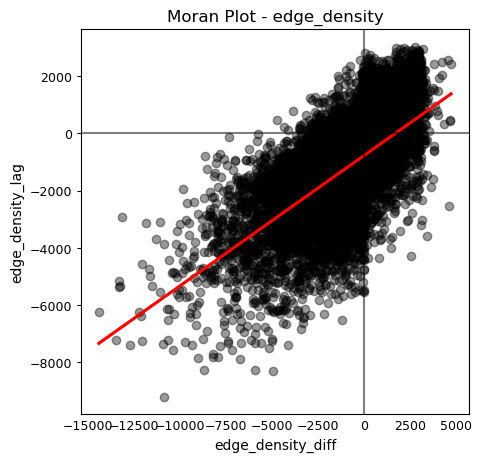

With significance 0.001, the Moran's I value for edge_density is 0.46


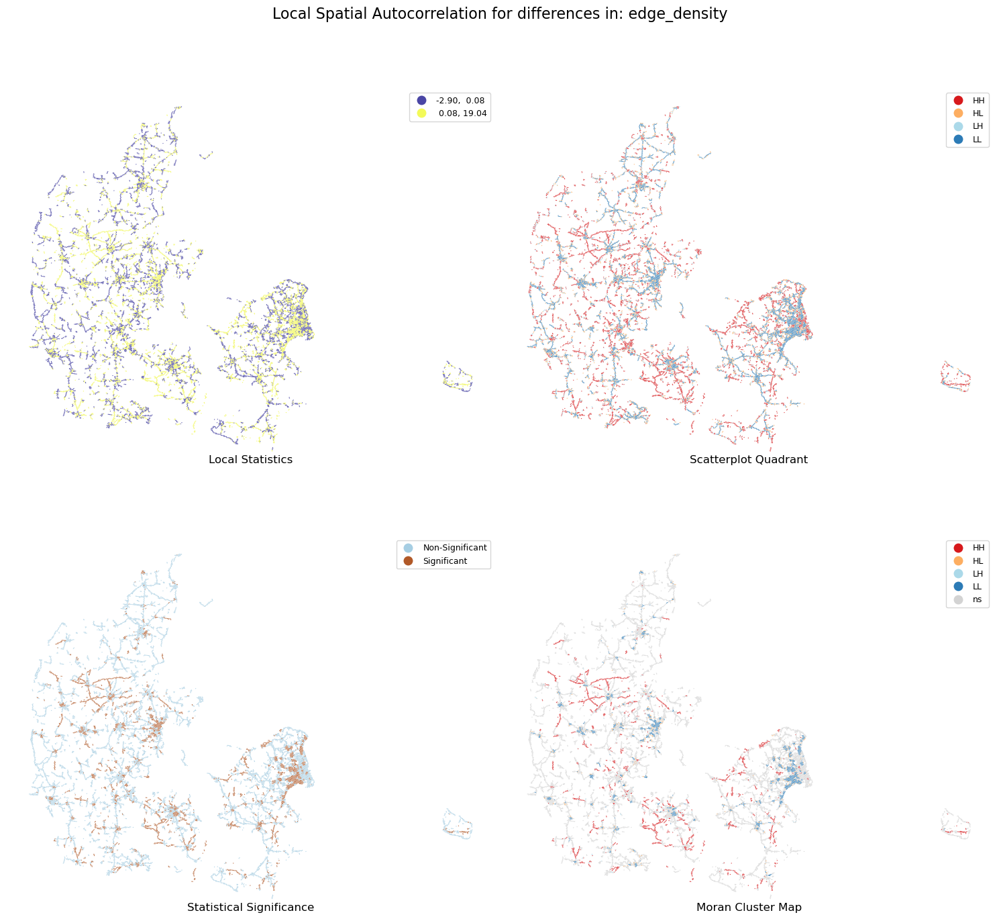

Using spatial weights k6, for 'edge_density', 1935 out of 16064 grid cells (12.05%) are part of a hotspot.
Using spatial weights k6, for 'edge_density', 1594 out of 16064 grid cells (9.92%) are part of a coldspot.




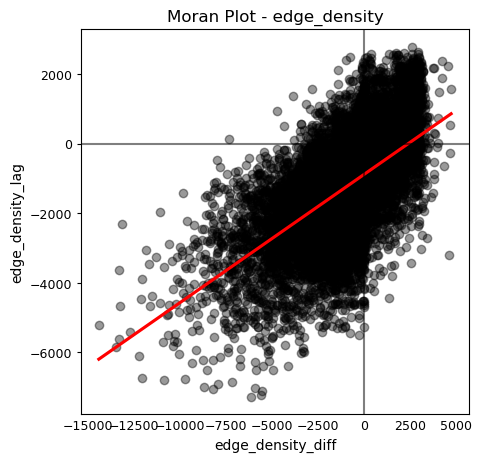

With significance 0.001, the Moran's I value for edge_density is 0.37


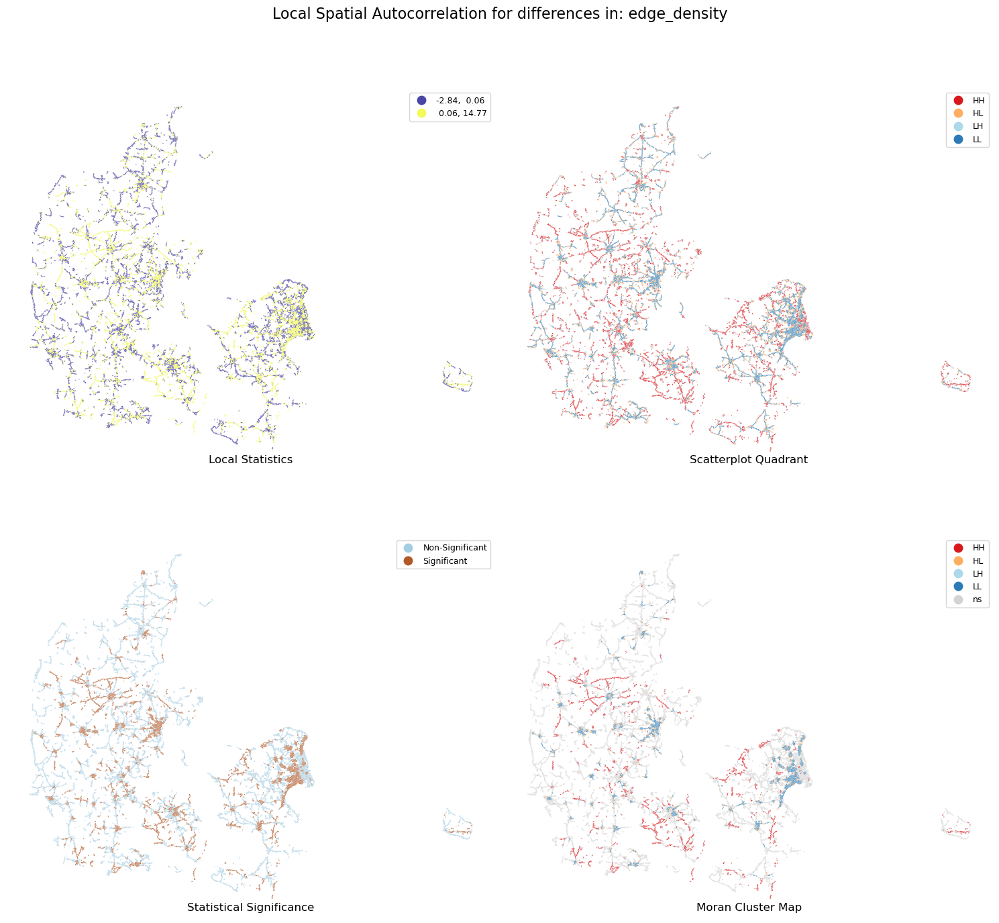

Using spatial weights k12, for 'edge_density', 2274 out of 16064 grid cells (14.16%) are part of a hotspot.
Using spatial weights k12, for 'edge_density', 2092 out of 16064 grid cells (13.02%) are part of a coldspot.




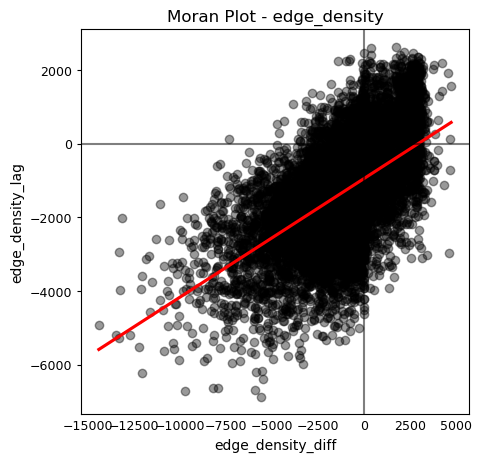

With significance 0.001, the Moran's I value for edge_density is 0.32


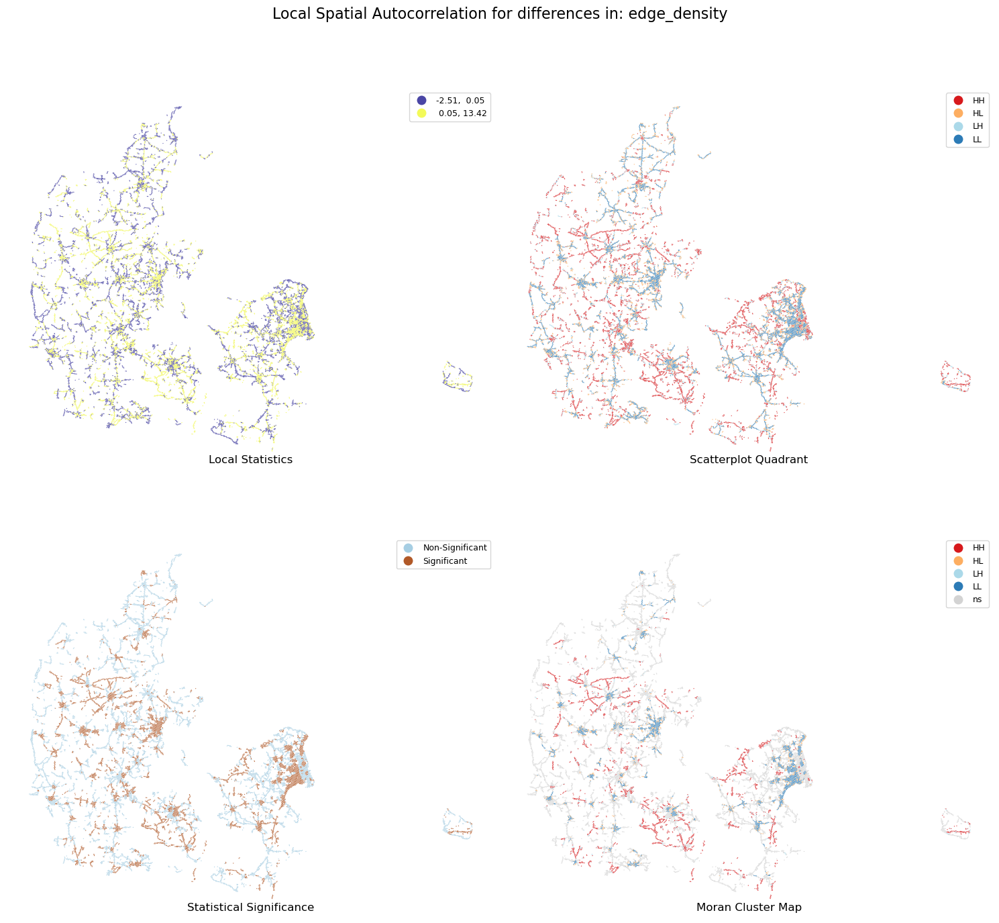

Using spatial weights k18, for 'edge_density', 2443 out of 16064 grid cells (15.21%) are part of a hotspot.
Using spatial weights k18, for 'edge_density', 2393 out of 16064 grid cells (14.90%) are part of a coldspot.




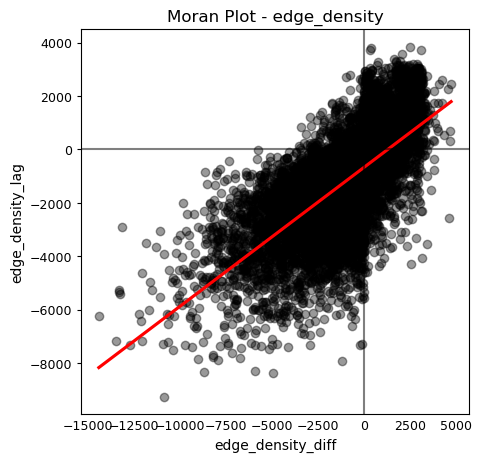

With significance 0.001, the Moran's I value for edge_density is 0.52


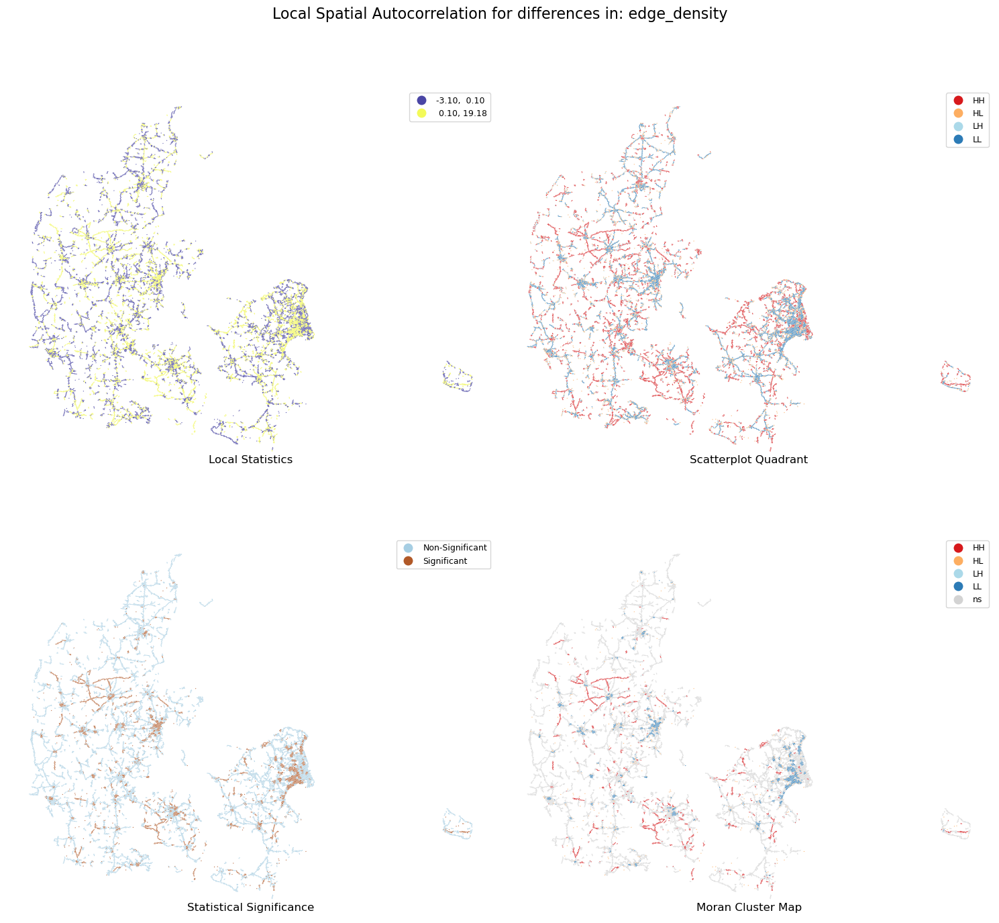

Using spatial weights dist1000, for 'edge_density', 1534 out of 16064 grid cells (9.55%) are part of a hotspot.
Using spatial weights dist1000, for 'edge_density', 1407 out of 16064 grid cells (8.76%) are part of a coldspot.




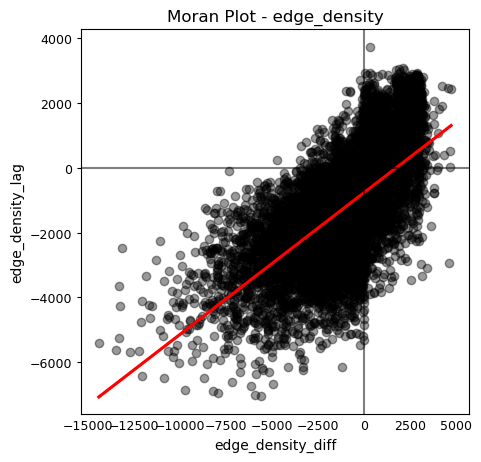

With significance 0.001, the Moran's I value for edge_density is 0.44


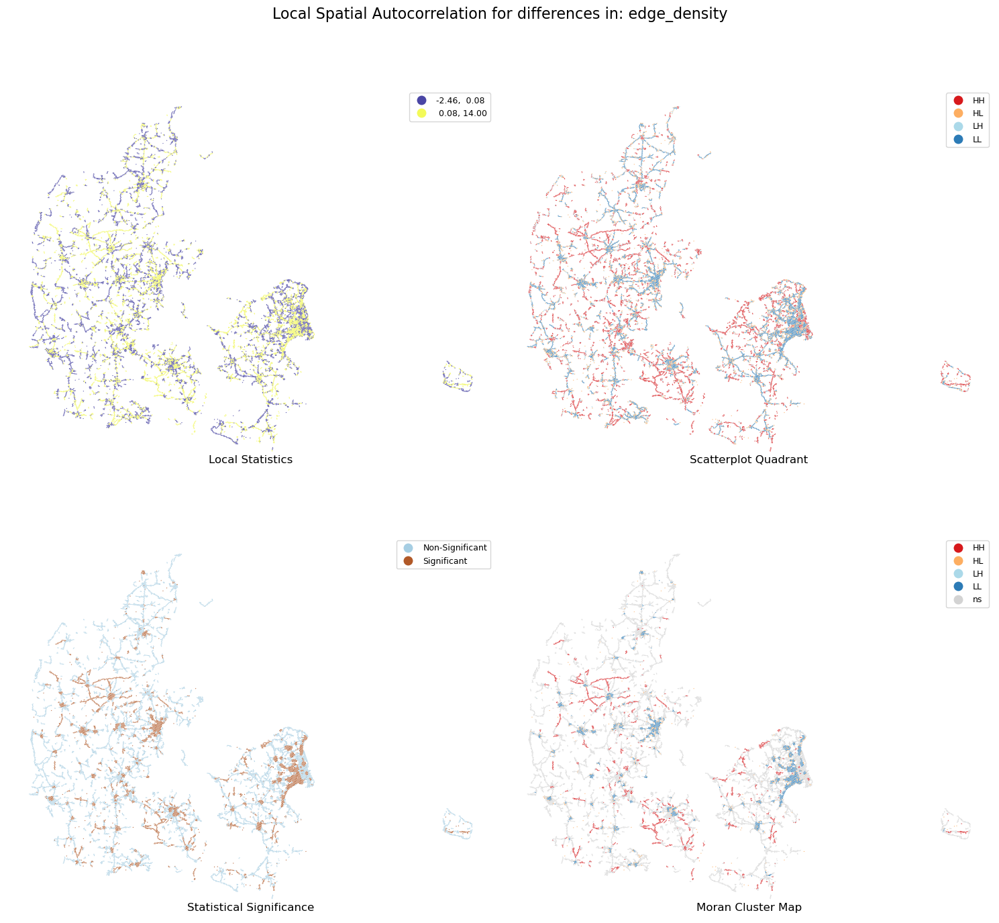

Using spatial weights dist2000, for 'edge_density', 1880 out of 16064 grid cells (11.70%) are part of a hotspot.
Using spatial weights dist2000, for 'edge_density', 1971 out of 16064 grid cells (12.27%) are part of a coldspot.




In [3]:
# dictionaries for results
all_morans = {}
all_lisas = {}
hotspot_count = {}
coldspot_count = {}

for name, w in all_weigths.items():
    morans_density = eval_func.compute_spatial_autocorrelation(
        col_names, variable_names, ex_grid_subset, w, filepaths
    )

    all_morans[name] = morans_density["edge_density"].I

    col_names = ["edge_density_diff"]
    variable_names = ["edge_density"]
    filepaths = [compare_analysis_plots_fp + f"lisa_edge_dens_{name}.png"]

    lisas_density = eval_func.compute_lisa(
        col_names, variable_names, ex_grid_subset, w, filepaths
    )

    all_lisas[name] = lisas_density["edge_density"]

    # Export
    q_cols = [v + "_q" for v in variable_names]
    q_cols.append("hex_id")
    ex_grid_subset.rename({"hex_id_osm": "hex_id"}, axis=1)[q_cols].to_csv(
        compare_analysis_data_fp + f"density_spatial_autocorrelation_{name}.csv",
        index=True,
    )

    for v in variable_names:
        hotspot = len(ex_grid_subset[ex_grid_subset[f"{v}_q"] == "HH"])
        coldspot = len(ex_grid_subset[ex_grid_subset[f"{v}_q"] == "LL"])

        print(
            f"Using spatial weights {name}, for '{v}', {hotspot} out of {len(ex_grid_subset)} grid cells ({hotspot/len(ex_grid_subset)*100:.2f}%) are part of a hotspot."
        )
        print(
            f"Using spatial weights {name}, for '{v}', {coldspot} out of {len(ex_grid_subset)} grid cells ({coldspot/len(ex_grid_subset)*100:.2f}%) are part of a coldspot."
        )
        print("\n")

        hotspot_count[name] = hotspot
        coldspot_count[name] = coldspot


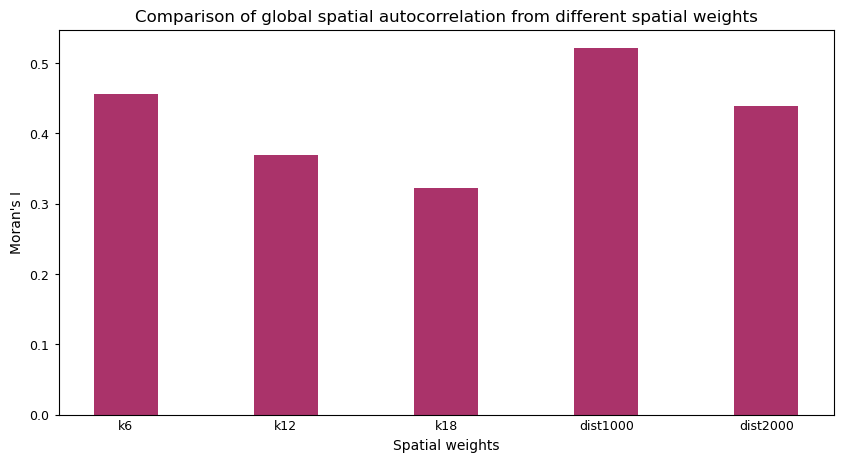

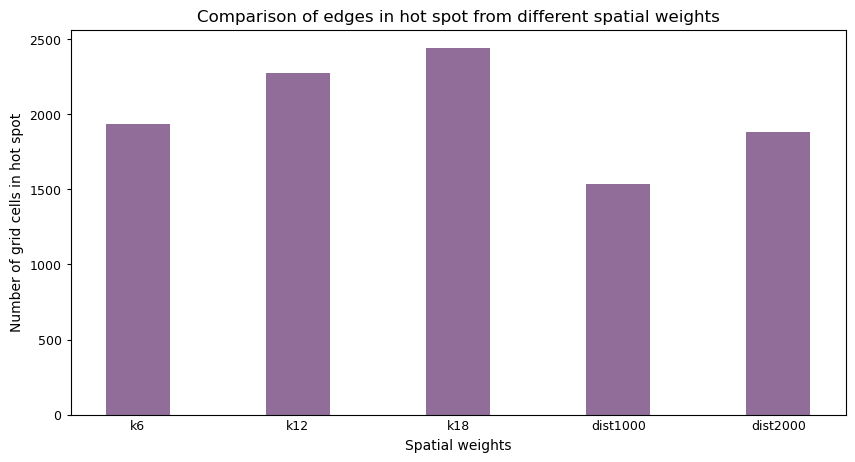

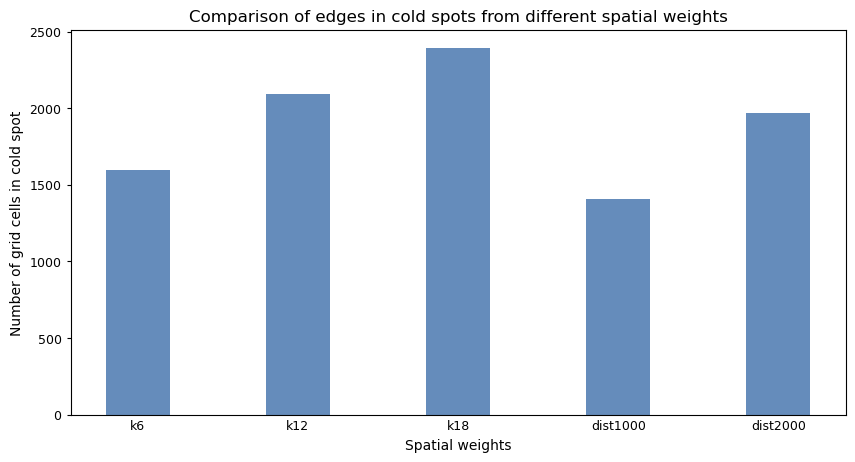

In [4]:
fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(all_morans.keys(), all_morans.values(), color="#AA336A", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Moran's I")
plt.title("Comparison of global spatial autocorrelation from different spatial weights")
plt.show()


fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(hotspot_count.keys(), hotspot_count.values(), color="#916E99", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Number of grid cells in hot spot")
plt.title("Comparison of edges in hot spot from different spatial weights")
plt.show()

fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(coldspot_count.keys(), coldspot_count.values(), color="#658CBB", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Number of grid cells in cold spot")
plt.title("Comparison of edges in cold spots from different spatial weights")
plt.show()


In [5]:
# read all local spatial autocorrelation results from CSV

df_k6 = pd.read_csv(
    compare_analysis_data_fp + f"density_spatial_autocorrelation_k6.csv",
    usecols=["edge_density_q", "hex_id"],
)
df_k6["name"] = "k6"

df_k12 = pd.read_csv(
    compare_analysis_data_fp + f"density_spatial_autocorrelation_k12.csv",
    usecols=["edge_density_q", "hex_id"],
)
df_k12["name"] = "k12"

df_k18 = pd.read_csv(
    compare_analysis_data_fp + f"density_spatial_autocorrelation_k18.csv",
    usecols=["edge_density_q", "hex_id"],
)
df_k18["name"] = "k18"

df_dist1 = pd.read_csv(
    compare_analysis_data_fp + f"density_spatial_autocorrelation_dist1000.csv",
    usecols=["edge_density_q", "hex_id"],
)
df_dist1["name"] = "dist1000"

df_dist2 = pd.read_csv(
    compare_analysis_data_fp + f"density_spatial_autocorrelation_dist2000.csv",
    usecols=["edge_density_q", "hex_id"],
)
df_dist2["name"] = "dist2000"

all_dfs = pd.concat([df_k6, df_k12, df_k18, df_dist1, df_dist2])

# group based on grid cell id

grouped = all_dfs.groupby("hex_id")

hex_classification_count = {}

# count unique quadrant classifications
for hex_id, group in grouped:
    hex_classification_count[hex_id] = len(group["edge_density_q"].unique())

count_reclassifications = [k for k, v in hex_classification_count.items() if v > 1]

print(
    f"{len(count_reclassifications)} out of {len(grouped)} grid cells change cluster type depending on the spatial weight definition used."
)


4962 out of 16064 grid cells change cluster type depending on the spatial weight definition used.


In [6]:
all_morans

{'k6': 0.45579981562158467,
 'k12': 0.36859511375089016,
 'k18': 0.32213091531734167,
 'dist1000': 0.5213947567962126,
 'dist2000': 0.438514275682633}

## Spatial patterns in feature matching success

To compare the sensitivity to the definition of spatial weights for another variable, update the data, column and variable name + data subset in the cell below.

### OSM Matched

In [7]:
# Read fm grid results
with open(
    compare_results_data_fp + f"grid_results_feature_matching_15_17_30.pickle", "rb"
) as fp:
    fm_grid = pickle.load(fp)

col_names = [
    "pct_matched_osm",
]
variable_names = ["osm_matched"]

filepaths = [
    compare_analysis_plots_fp + "morans_osm_matched_test.png",
]

fm_grid_osm_subset = fm_grid.loc[(~fm_grid.count_osm_segments.isna())].copy()

# Compute spatial weights
w_k6 = eval_func.compute_spatial_weights(
    fm_grid_osm_subset, "grid_id", "knn", k=6
)  # using filler col for subset
w_k12 = eval_func.compute_spatial_weights(
    fm_grid_osm_subset, "grid_id", "knn", k=12
)  # using filler col for subset
w_k18 = eval_func.compute_spatial_weights(
    fm_grid_osm_subset, "grid_id", "knn", k=18
)  # using filler col for subset
dist_1000 = eval_func.compute_spatial_weights(
    fm_grid_osm_subset, "grid_id", "dist", dist=1000
)  # using filler col for subset
dist_2000 = eval_func.compute_spatial_weights(
    fm_grid_osm_subset, "grid_id", "dist", dist=2000
)  # using filler col for subset


all_weigths = {
    "k6": w_k6,
    "k12": w_k12,
    "k18": w_k18,
    "dist1000": dist_1000,
    "dist2000": dist_2000,
}


/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 21 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 5 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 5 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:167: UserWarning: There are 153 disconnected 

no valid type defined
('WARNING: ', 16, ' is an island (no neighbors)')
('WARNING: ', 37, ' is an island (no neighbors)')
('WARNING: ', 111, ' is an island (no neighbors)')
('WARNING: ', 259, ' is an island (no neighbors)')
('WARNING: ', 472, ' is an island (no neighbors)')
('WARNING: ', 478, ' is an island (no neighbors)')
('WARNING: ', 568, ' is an island (no neighbors)')
('WARNING: ', 574, ' is an island (no neighbors)')
('WARNING: ', 632, ' is an island (no neighbors)')
('WARNING: ', 860, ' is an island (no neighbors)')
('WARNING: ', 913, ' is an island (no neighbors)')
('WARNING: ', 926, ' is an island (no neighbors)')
('WARNING: ', 1010, ' is an island (no neighbors)')
('WARNING: ', 1038, ' is an island (no neighbors)')
('WARNING: ', 1053, ' is an island (no neighbors)')
('WARNING: ', 1110, ' is an island (no neighbors)')
('WARNING: ', 1113, ' is an island (no neighbors)')
('WARNING: ', 1129, ' is an island (no neighbors)')
('WARNING: ', 1143, ' is an island (no neighbors)')
('WA

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:167: UserWarning: There are 103 disconnected observations 
  Island ids: 16, 37, 111, 259, 472, 478, 568, 574, 632, 860, 913, 1010, 1038, 1113, 1129, 1213, 1620, 1737, 1755, 2064, 2136, 2156, 2591, 2727, 2859, 2963, 3253, 3480, 3635, 3875, 3876, 3953, 4257, 4387, 4685, 4793, 4993, 5066, 5212, 5295, 5317, 5333, 5551, 5559, 5581, 5629, 5702, 5746, 5761, 5875, 5999, 6065, 6381, 6656, 6895, 6970, 7261, 7319, 7347, 7483, 7709, 7845, 7948, 8016, 8080, 8273, 8364, 8416, 8451, 8549, 8580, 8679, 8880, 9029, 9177, 9296, 9575, 9663, 9820, 9924, 9969, 10068, 10096, 10297, 11025, 11061, 11155, 11184, 11202, 11352, 11575, 11712, 11769, 12111, 12287, 12381, 12419, 13247, 13419, 13735, 13861, 14161, 14451
  warnings.warn("There are %d disconnected observations" % ni + ' \n '


no valid type defined
('WARNING: ', 16, ' is an island (no neighbors)')
('WARNING: ', 37, ' is an island (no neighbors)')
('WARNING: ', 111, ' is an island (no neighbors)')
('WARNING: ', 259, ' is an island (no neighbors)')
('WARNING: ', 472, ' is an island (no neighbors)')
('WARNING: ', 478, ' is an island (no neighbors)')
('WARNING: ', 568, ' is an island (no neighbors)')
('WARNING: ', 574, ' is an island (no neighbors)')
('WARNING: ', 632, ' is an island (no neighbors)')
('WARNING: ', 860, ' is an island (no neighbors)')
('WARNING: ', 913, ' is an island (no neighbors)')
('WARNING: ', 1010, ' is an island (no neighbors)')
('WARNING: ', 1038, ' is an island (no neighbors)')
('WARNING: ', 1113, ' is an island (no neighbors)')
('WARNING: ', 1129, ' is an island (no neighbors)')
('WARNING: ', 1213, ' is an island (no neighbors)')
('WARNING: ', 1620, ' is an island (no neighbors)')
('WARNING: ', 1737, ' is an island (no neighbors)')
('WARNING: ', 1755, ' is an island (no neighbors)')
('W

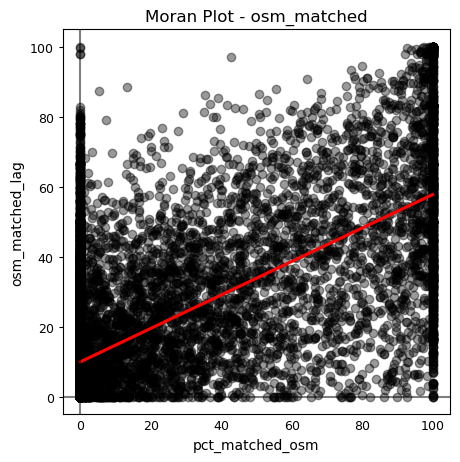

With significance 0.001, the Moran's I value for osm_matched is 0.48


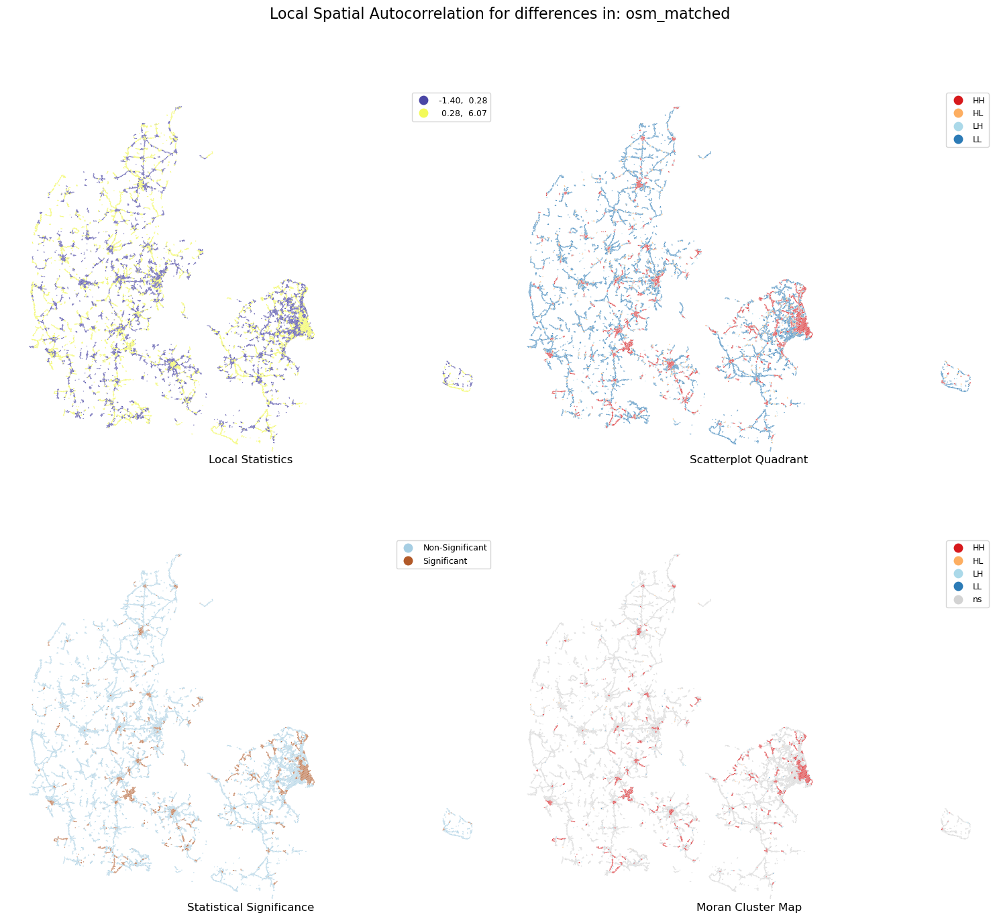

Using spatial weights k6, for 'osm_matched', 1737 out of 14506 grid cells (11.97%) are part of a hotspot.
Using spatial weights k6, for 'osm_matched', 37 out of 14506 grid cells (0.26%) are part of a coldspot.




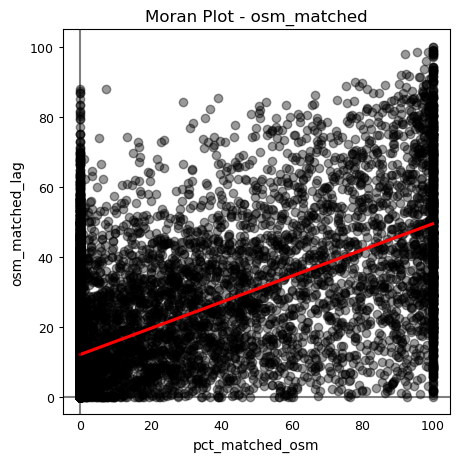

With significance 0.001, the Moran's I value for osm_matched is 0.37


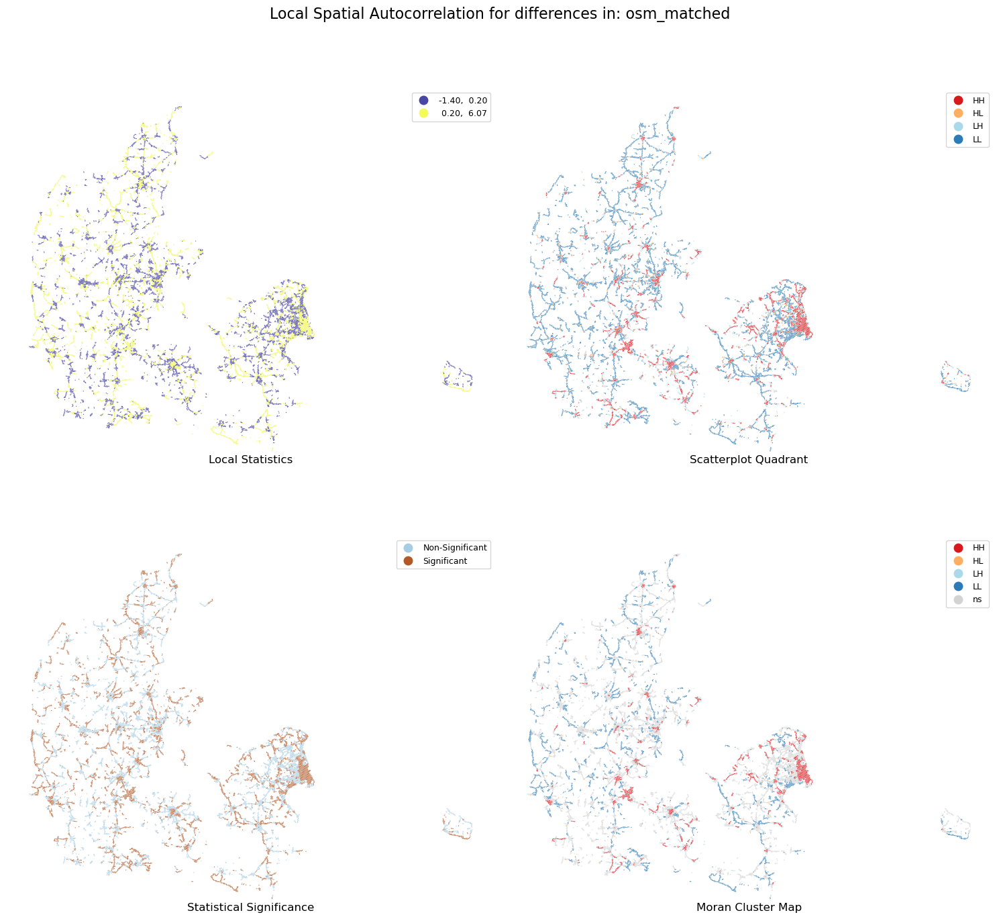

Using spatial weights k12, for 'osm_matched', 1900 out of 14506 grid cells (13.10%) are part of a hotspot.
Using spatial weights k12, for 'osm_matched', 4038 out of 14506 grid cells (27.84%) are part of a coldspot.




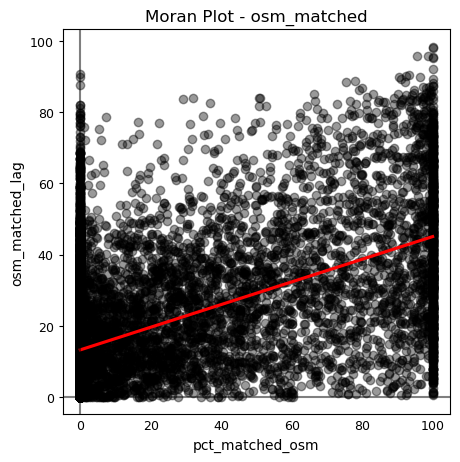

With significance 0.001, the Moran's I value for osm_matched is 0.32


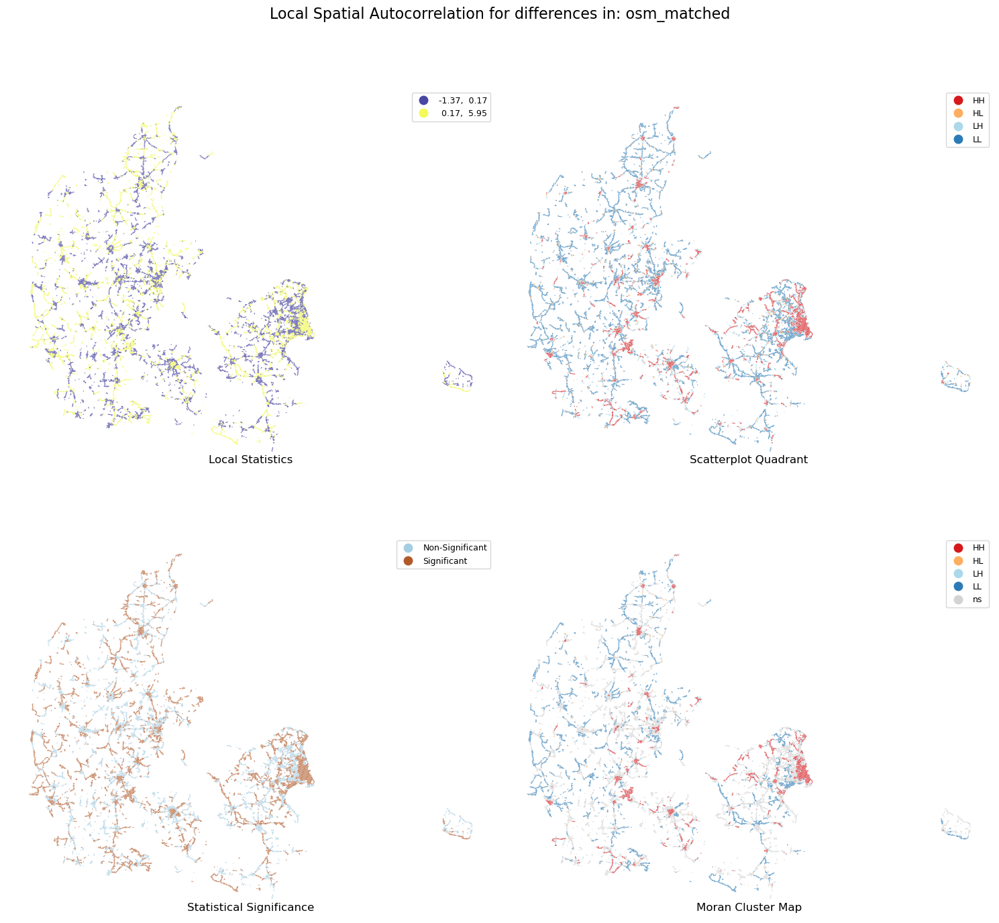

Using spatial weights k18, for 'osm_matched', 1966 out of 14506 grid cells (13.55%) are part of a hotspot.
Using spatial weights k18, for 'osm_matched', 4343 out of 14506 grid cells (29.94%) are part of a coldspot.




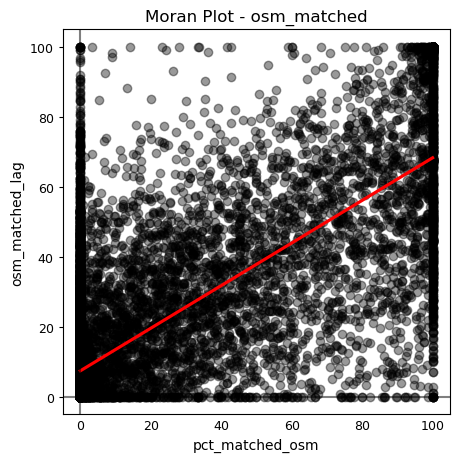

With significance 0.001, the Moran's I value for osm_matched is 0.61


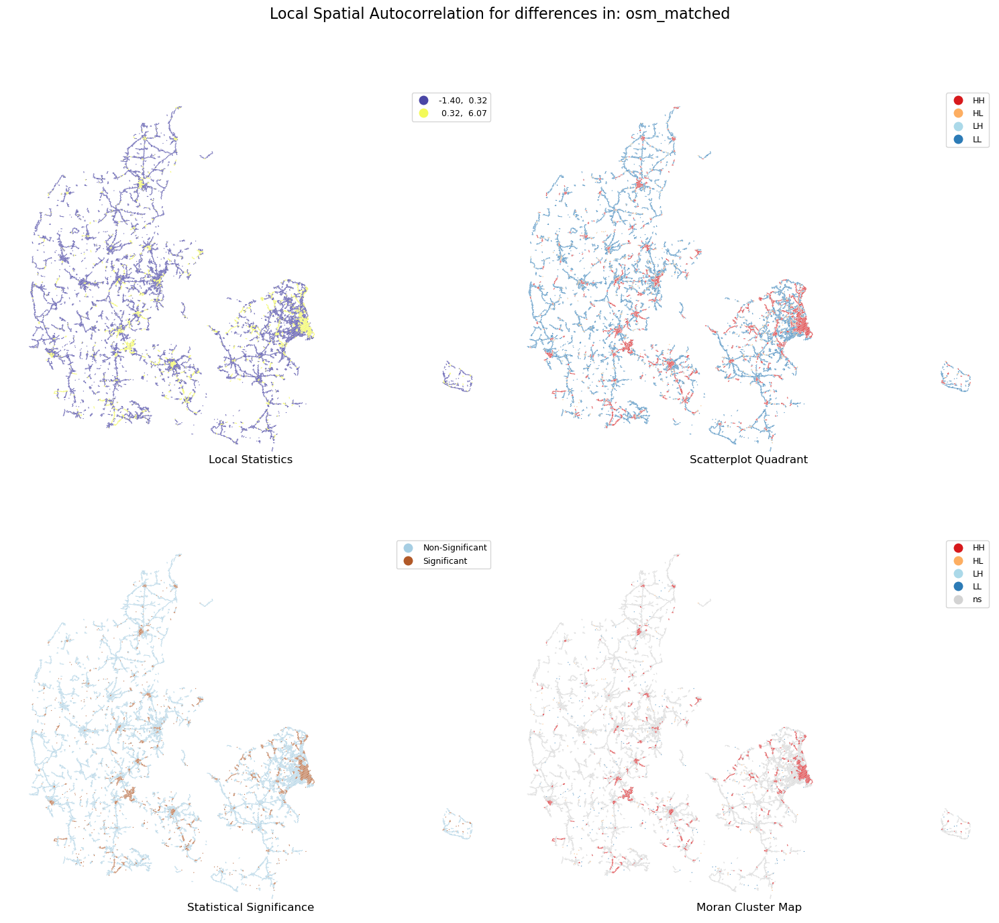

Using spatial weights dist1000, for 'osm_matched', 1708 out of 14506 grid cells (11.77%) are part of a hotspot.
Using spatial weights dist1000, for 'osm_matched', 178 out of 14506 grid cells (1.23%) are part of a coldspot.




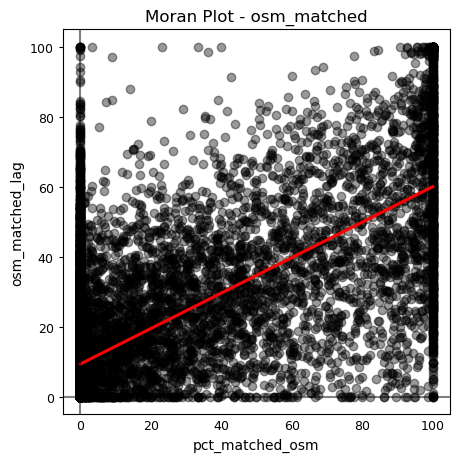

With significance 0.001, the Moran's I value for osm_matched is 0.51


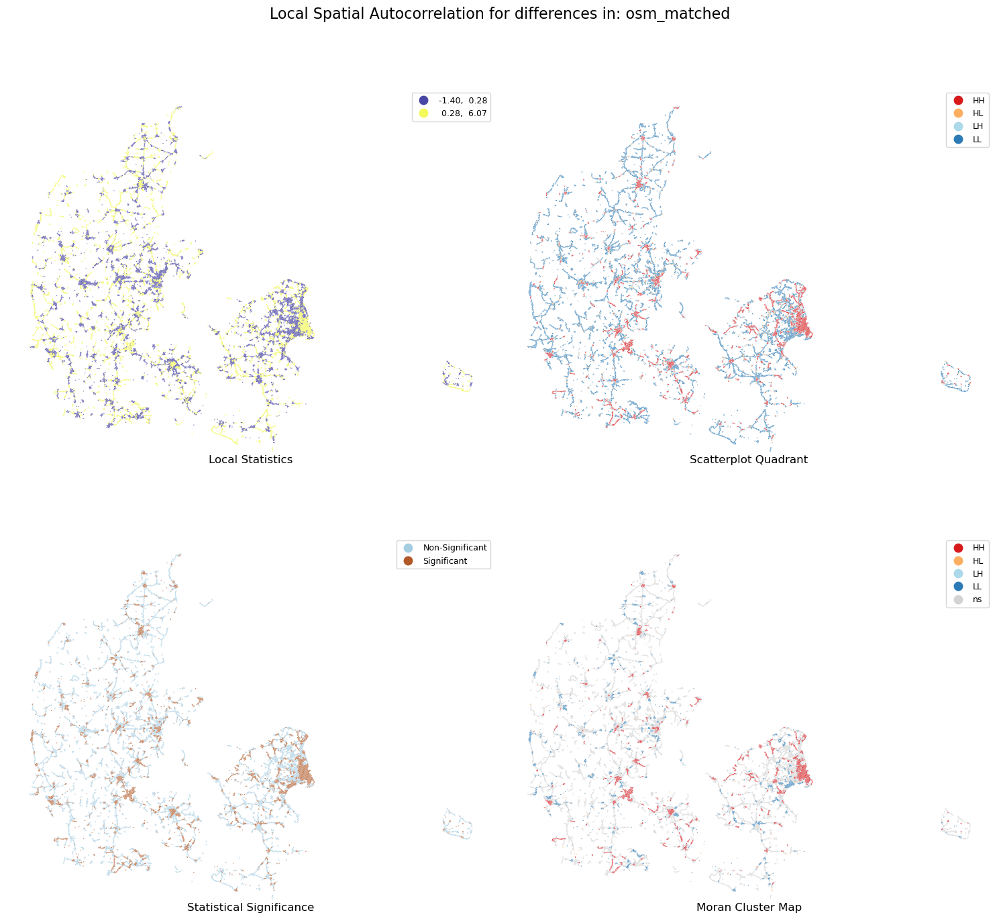

Using spatial weights dist2000, for 'osm_matched', 2056 out of 14506 grid cells (14.17%) are part of a hotspot.
Using spatial weights dist2000, for 'osm_matched', 1737 out of 14506 grid cells (11.97%) are part of a coldspot.




In [8]:
# dictionaries for results
all_morans = {}
all_lisas = {}
hotspot_count = {}
coldspot_count = {}

for name, w in all_weigths.items():
    morans_osm_matched = eval_func.compute_spatial_autocorrelation(
        col_names, variable_names, fm_grid_osm_subset, w, filepaths
    )

    all_morans[name] = morans_osm_matched["osm_matched"].I

    # col_names = ["edge_density_diff"]
    # variable_names = ["edge_density"]
    filepaths = [compare_analysis_plots_fp + f"lisa_osm_matched_test_{name}.png"]

    lisas_density = eval_func.compute_lisa(
        col_names, variable_names, fm_grid_osm_subset, w, filepaths
    )

    all_lisas[name] = lisas_density["osm_matched"]

    # Export
    q_cols = [v + "_q" for v in variable_names]
    q_cols.append("grid_id")
    fm_grid_osm_subset[q_cols].to_csv(
        compare_analysis_data_fp + f"osm_matched_spatial_autocorrelation_{name}.csv",
        index=True,
    )

    for v in variable_names:
        hotspot = len(fm_grid_osm_subset[fm_grid_osm_subset[f"{v}_q"] == "HH"])
        coldspot = len(fm_grid_osm_subset[fm_grid_osm_subset[f"{v}_q"] == "LL"])

        print(
            f"Using spatial weights {name}, for '{v}', {hotspot} out of {len(fm_grid_osm_subset)} grid cells ({hotspot/len(fm_grid_osm_subset)*100:.2f}%) are part of a hotspot."
        )
        print(
            f"Using spatial weights {name}, for '{v}', {coldspot} out of {len(fm_grid_osm_subset)} grid cells ({coldspot/len(fm_grid_osm_subset)*100:.2f}%) are part of a coldspot."
        )
        print("\n")

        hotspot_count[name] = hotspot
        coldspot_count[name] = coldspot

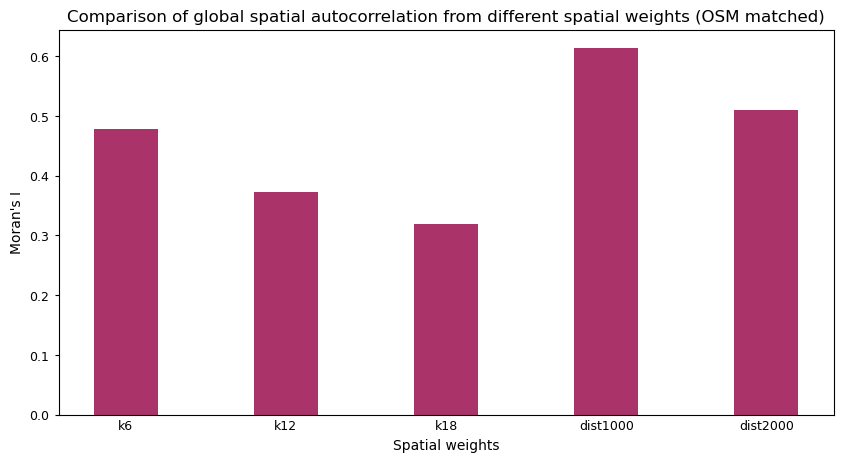

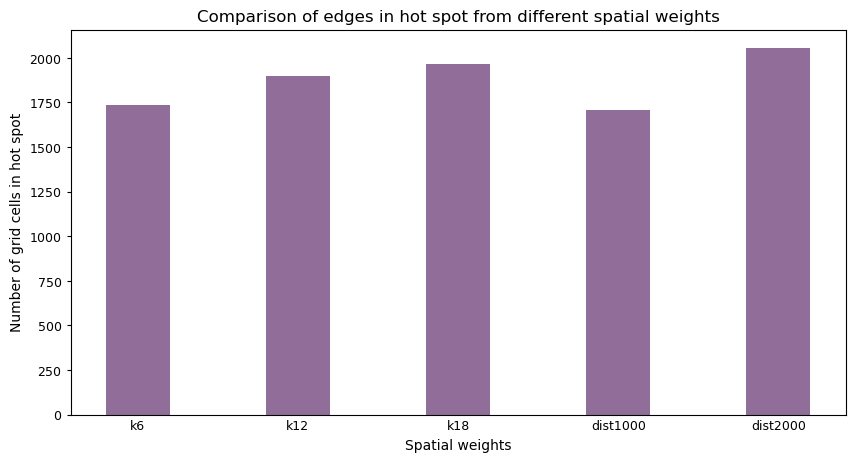

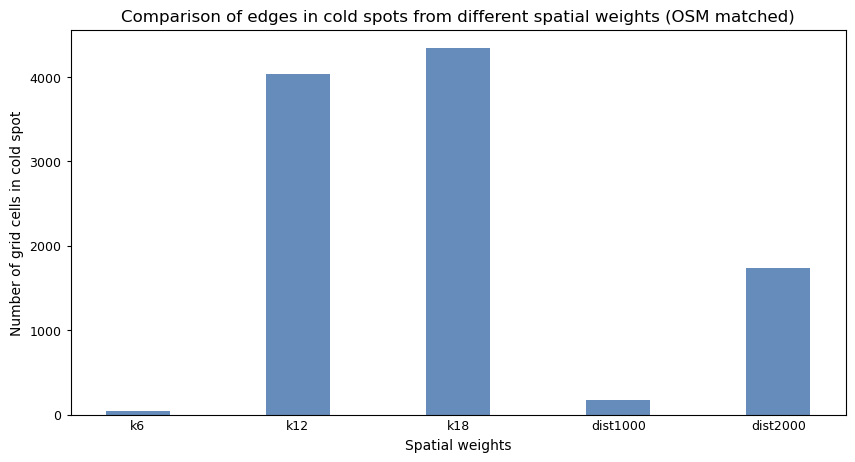

In [9]:
fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(all_morans.keys(), all_morans.values(), color="#AA336A", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Moran's I")
plt.title("Comparison of global spatial autocorrelation from different spatial weights (OSM matched)")
plt.show()


fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(hotspot_count.keys(), hotspot_count.values(), color="#916E99", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Number of grid cells in hot spot")
plt.title("Comparison of edges in hot spot from different spatial weights")
plt.show()

fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(coldspot_count.keys(), coldspot_count.values(), color="#658CBB", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Number of grid cells in cold spot")
plt.title("Comparison of edges in cold spots from different spatial weights (OSM matched)")
plt.show()

In [10]:
# read all local spatial autocorrelation results from CSV

df_k6 = pd.read_csv(
    compare_analysis_data_fp + f"osm_matched_spatial_autocorrelation_k6.csv",
    usecols=["osm_matched_q", "grid_id"],
)
df_k6["name"] = "k6"

df_k12 = pd.read_csv(
    compare_analysis_data_fp + f"osm_matched_spatial_autocorrelation_k12.csv",
    usecols=["osm_matched_q", "grid_id"],
)
df_k12["name"] = "k12"

df_k18 = pd.read_csv(
    compare_analysis_data_fp + f"osm_matched_spatial_autocorrelation_k18.csv",
    usecols=["osm_matched_q", "grid_id"],
)
df_k18["name"] = "k18"

df_dist1 = pd.read_csv(
    compare_analysis_data_fp + f"osm_matched_spatial_autocorrelation_dist1000.csv",
    usecols=["osm_matched_q", "grid_id"],
)
df_dist1["name"] = "dist1000"

df_dist2 = pd.read_csv(
    compare_analysis_data_fp + f"osm_matched_spatial_autocorrelation_dist2000.csv",
    usecols=["osm_matched_q", "grid_id"],
)
df_dist2["name"] = "dist2000"

all_dfs = pd.concat([df_k6, df_k12, df_k18, df_dist1, df_dist2])

# group based on grid cell id

grouped = all_dfs.groupby("grid_id")

hex_classification_count = {}

# count unique quadrant classifications
for hex_id, group in grouped:
    hex_classification_count[hex_id] = len(group["osm_matched_q"].unique())

count_reclassifications = [k for k, v in hex_classification_count.items() if v > 1]

print(
    f"{len(count_reclassifications)} out of {len(grouped)} grid cells change cluster type depending on the spatial weight definition used."
)

7622 out of 14506 grid cells change cluster type depending on the spatial weight definition used.


In [11]:
all_morans

{'k6': 0.477986096191796,
 'k12': 0.37324091772839285,
 'k18': 0.3180964995494062,
 'dist1000': 0.6135908567864357,
 'dist2000': 0.5089508378843536}

### GeoDanmark Matched

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 32 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 4 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 2 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:167: UserWarning: There are 212 disconnected 

no valid type defined
('WARNING: ', 43, ' is an island (no neighbors)')
('WARNING: ', 53, ' is an island (no neighbors)')
('WARNING: ', 77, ' is an island (no neighbors)')
('WARNING: ', 80, ' is an island (no neighbors)')
('WARNING: ', 106, ' is an island (no neighbors)')
('WARNING: ', 127, ' is an island (no neighbors)')
('WARNING: ', 207, ' is an island (no neighbors)')
('WARNING: ', 220, ' is an island (no neighbors)')
('WARNING: ', 221, ' is an island (no neighbors)')
('WARNING: ', 237, ' is an island (no neighbors)')
('WARNING: ', 329, ' is an island (no neighbors)')
('WARNING: ', 408, ' is an island (no neighbors)')
('WARNING: ', 457, ' is an island (no neighbors)')
('WARNING: ', 495, ' is an island (no neighbors)')
('WARNING: ', 508, ' is an island (no neighbors)')
('WARNING: ', 511, ' is an island (no neighbors)')
('WARNING: ', 532, ' is an island (no neighbors)')
('WARNING: ', 542, ' is an island (no neighbors)')
('WARNING: ', 617, ' is an island (no neighbors)')
('WARNING: ',

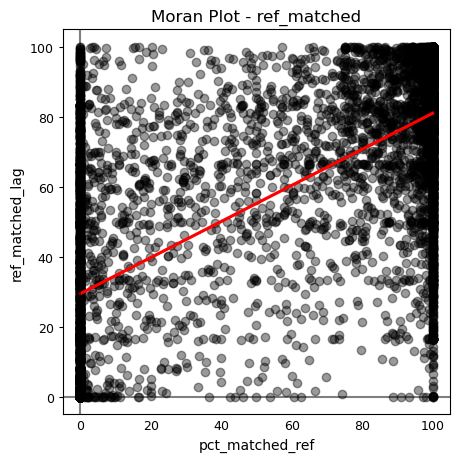

With significance 0.001, the Moran's I value for ref_matched is 0.52


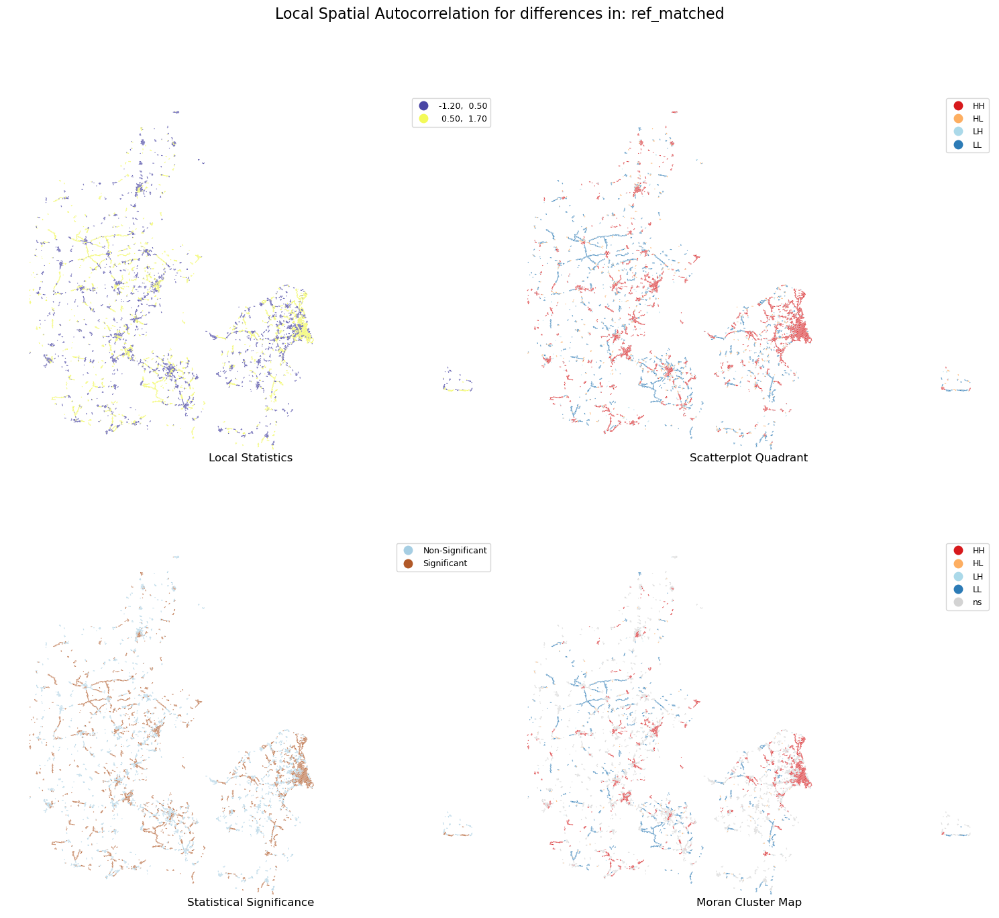

Using spatial weights k6, for 'ref_matched', 1861 out of 7413 grid cells (25.10%) are part of a hotspot.
Using spatial weights k6, for 'ref_matched', 1497 out of 7413 grid cells (20.19%) are part of a coldspot.




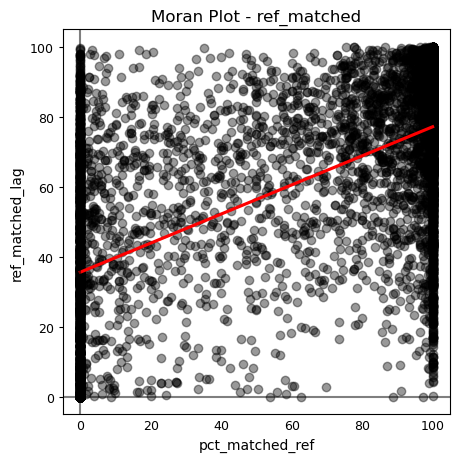

With significance 0.001, the Moran's I value for ref_matched is 0.42


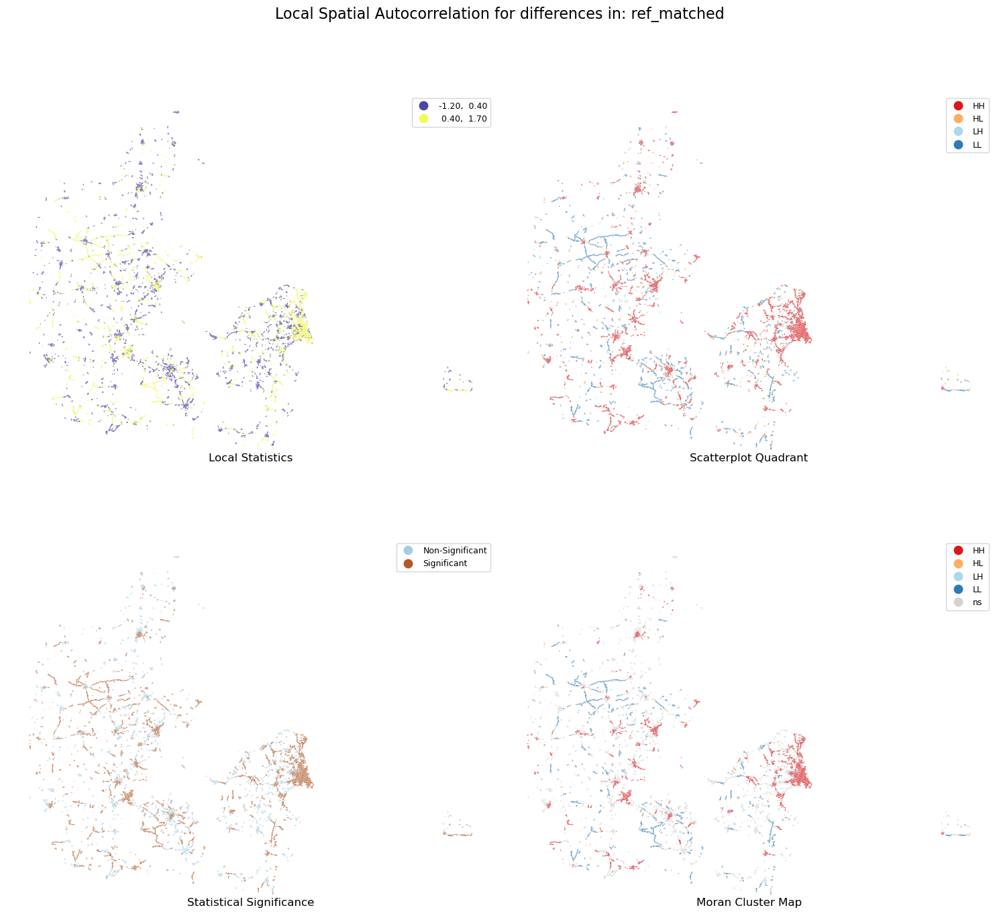

Using spatial weights k12, for 'ref_matched', 2164 out of 7413 grid cells (29.19%) are part of a hotspot.
Using spatial weights k12, for 'ref_matched', 1522 out of 7413 grid cells (20.53%) are part of a coldspot.




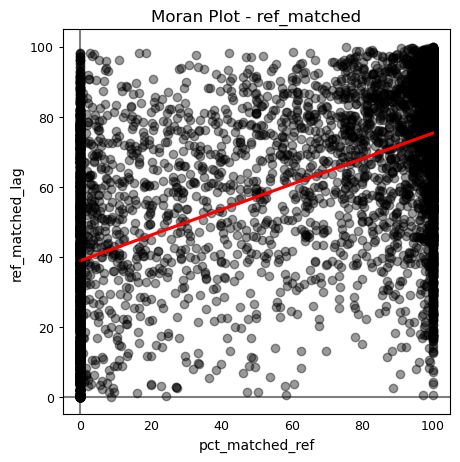

With significance 0.001, the Moran's I value for ref_matched is 0.36


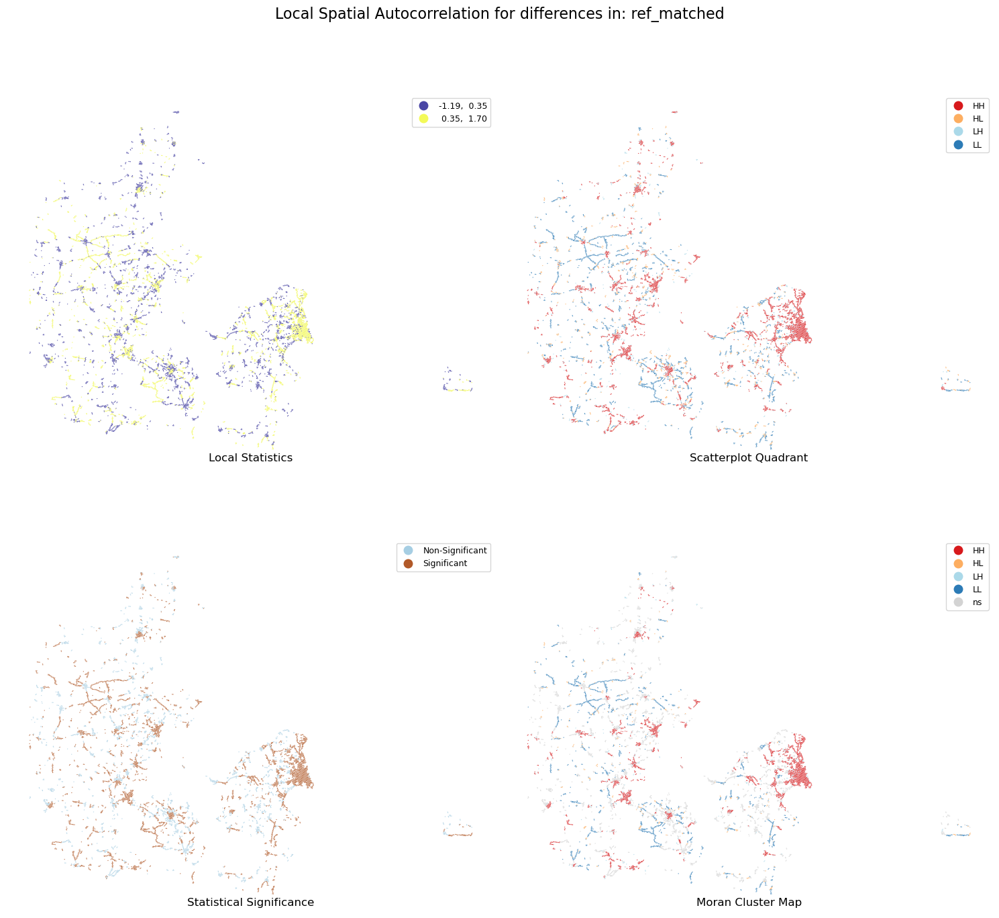

Using spatial weights k18, for 'ref_matched', 2308 out of 7413 grid cells (31.13%) are part of a hotspot.
Using spatial weights k18, for 'ref_matched', 1527 out of 7413 grid cells (20.60%) are part of a coldspot.




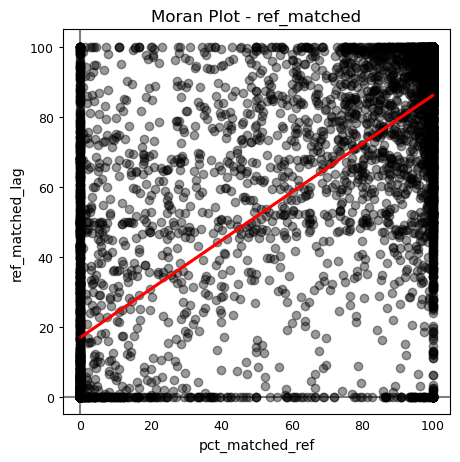

With significance 0.001, the Moran's I value for ref_matched is 0.70


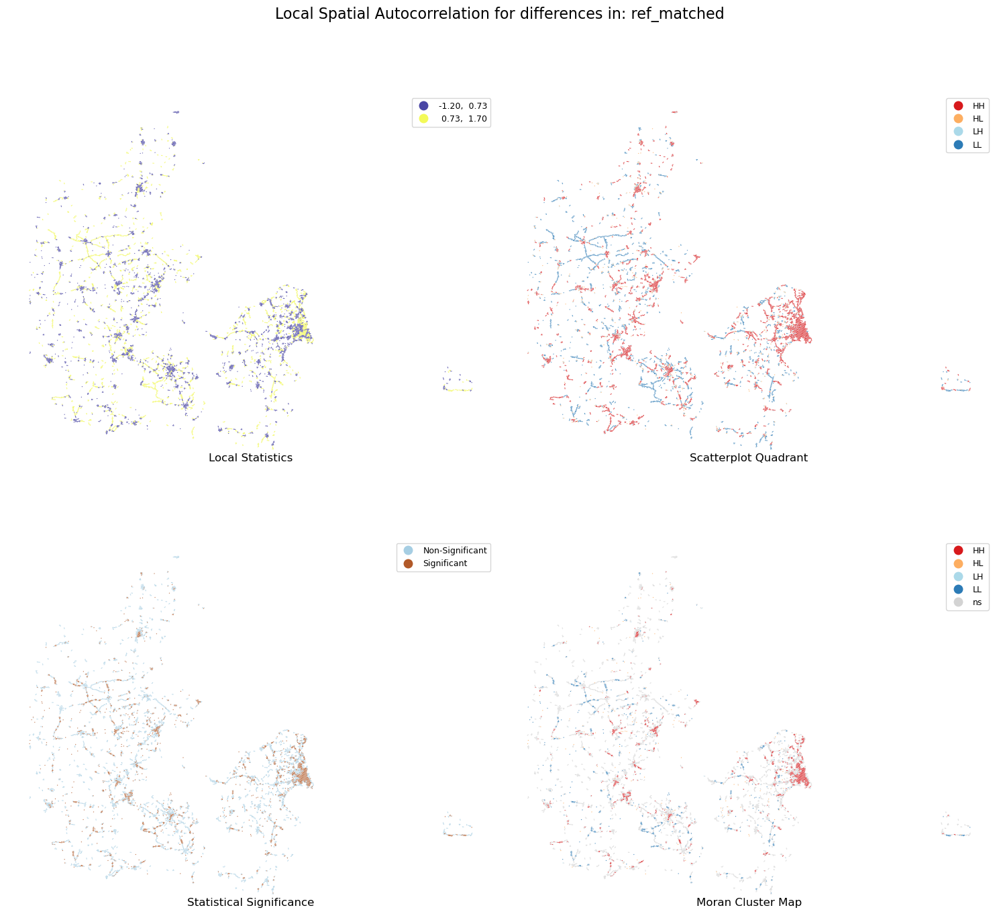

Using spatial weights dist1000, for 'ref_matched', 1205 out of 7413 grid cells (16.26%) are part of a hotspot.
Using spatial weights dist1000, for 'ref_matched', 780 out of 7413 grid cells (10.52%) are part of a coldspot.




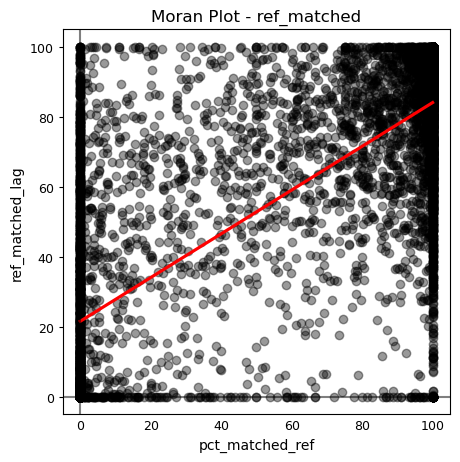

With significance 0.001, the Moran's I value for ref_matched is 0.63


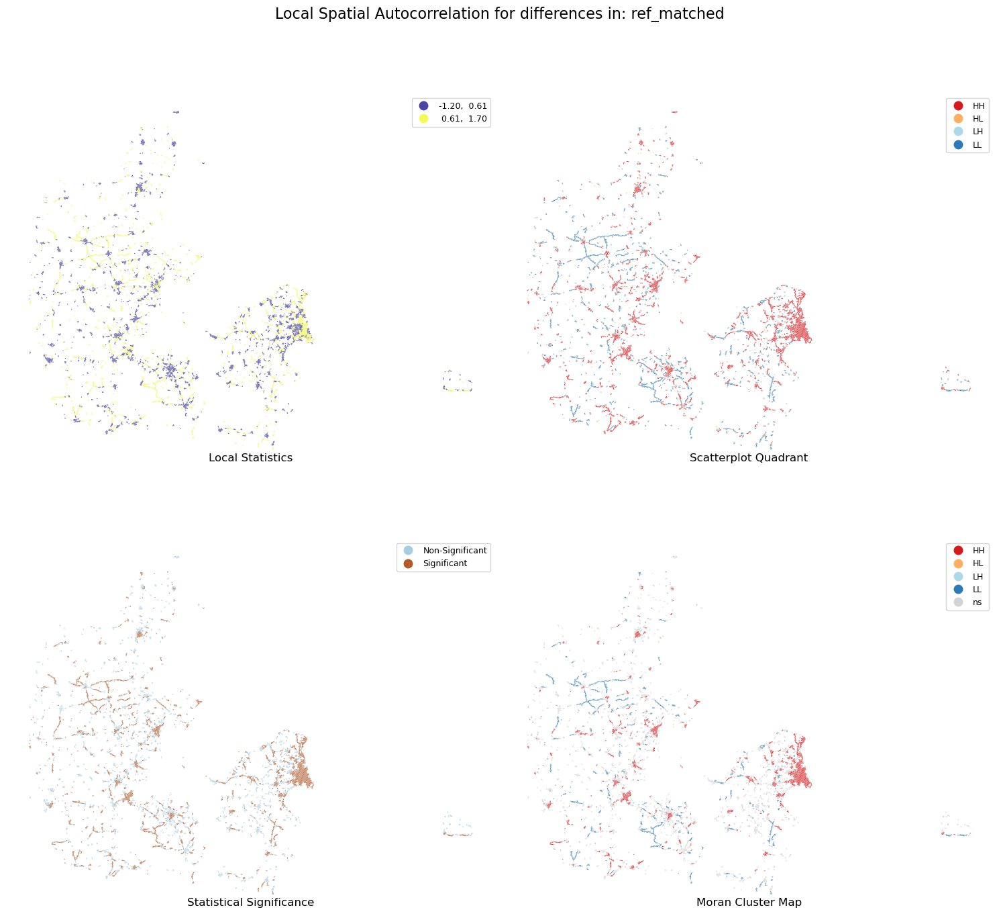

Using spatial weights dist2000, for 'ref_matched', 2038 out of 7413 grid cells (27.49%) are part of a hotspot.
Using spatial weights dist2000, for 'ref_matched', 1405 out of 7413 grid cells (18.95%) are part of a coldspot.




In [12]:
# Read fm grid results
with open(
    compare_results_data_fp + f"grid_results_feature_matching_15_17_30.pickle", "rb"
) as fp:
    fm_grid = pickle.load(fp)

col_names = [
    "pct_matched_ref",
]
variable_names = ["ref_matched"]

filepaths = [
    compare_analysis_plots_fp + "morans_geodk_matched_test.png",
]

fm_grid_geodk_subset = fm_grid.loc[(~fm_grid.count_ref_segments.isna())].copy()

# Compute spatial weights
w_k6 = eval_func.compute_spatial_weights(
    fm_grid_geodk_subset, "grid_id", "knn", k=6
)  # using filler col for subset
w_k12 = eval_func.compute_spatial_weights(
    fm_grid_geodk_subset, "grid_id", "knn", k=12
)  # using filler col for subset
w_k18 = eval_func.compute_spatial_weights(
    fm_grid_geodk_subset, "grid_id", "knn", k=18
)  # using filler col for subset
dist_1000 = eval_func.compute_spatial_weights(
    fm_grid_geodk_subset, "grid_id", "dist", dist=1000
)  # using filler col for subset
dist_2000 = eval_func.compute_spatial_weights(
    fm_grid_geodk_subset, "grid_id", "dist", dist=2000
)  # using filler col for subset


all_weigths = {
    "k6": w_k6,
    "k12": w_k12,
    "k18": w_k18,
    "dist1000": dist_1000,
    "dist2000": dist_2000,
}


# dictionaries for results
all_morans = {}
all_lisas = {}
hotspot_count = {}
coldspot_count = {}

for name, w in all_weigths.items():
    morans_geodk_matched = eval_func.compute_spatial_autocorrelation(
        col_names, variable_names, fm_grid_geodk_subset, w, filepaths
    )

    all_morans[name] = morans_geodk_matched["ref_matched"].I

    # col_names = ["edge_density_diff"]
    # variable_names = ["edge_density"]
    filepaths = [compare_analysis_plots_fp + f"lisa_geodk_matched_test_{name}.png"]

    lisas_density = eval_func.compute_lisa(
        col_names, variable_names, fm_grid_geodk_subset, w, filepaths
    )

    all_lisas[name] = lisas_density["ref_matched"]

    # Export
    q_cols = [v + "_q" for v in variable_names]
    q_cols.append("grid_id")
    fm_grid_geodk_subset[q_cols].to_csv(
        compare_analysis_data_fp + f"geodk_matched_spatial_autocorrelation_{name}.csv",
        index=True,
    )

    for v in variable_names:
        hotspot = len(fm_grid_geodk_subset[fm_grid_geodk_subset[f"{v}_q"] == "HH"])
        coldspot = len(fm_grid_geodk_subset[fm_grid_geodk_subset[f"{v}_q"] == "LL"])

        print(
            f"Using spatial weights {name}, for '{v}', {hotspot} out of {len(fm_grid_geodk_subset)} grid cells ({hotspot/len(fm_grid_geodk_subset)*100:.2f}%) are part of a hotspot."
        )
        print(
            f"Using spatial weights {name}, for '{v}', {coldspot} out of {len(fm_grid_geodk_subset)} grid cells ({coldspot/len(fm_grid_geodk_subset)*100:.2f}%) are part of a coldspot."
        )
        print("\n")

        hotspot_count[name] = hotspot
        coldspot_count[name] = coldspot

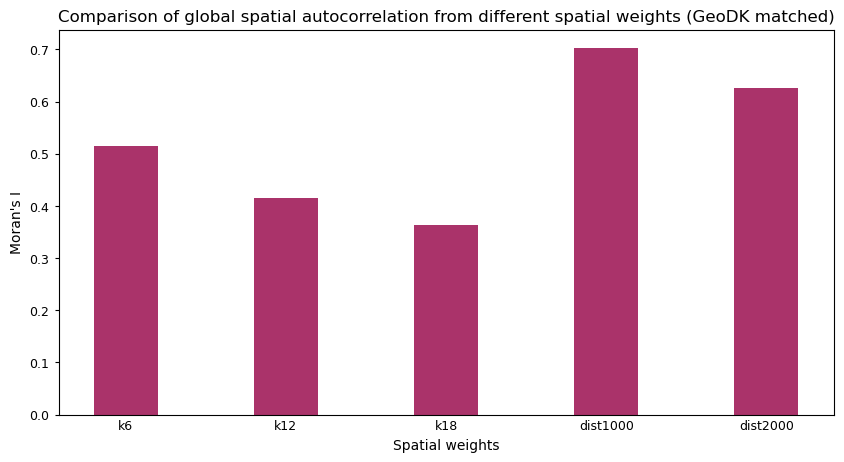

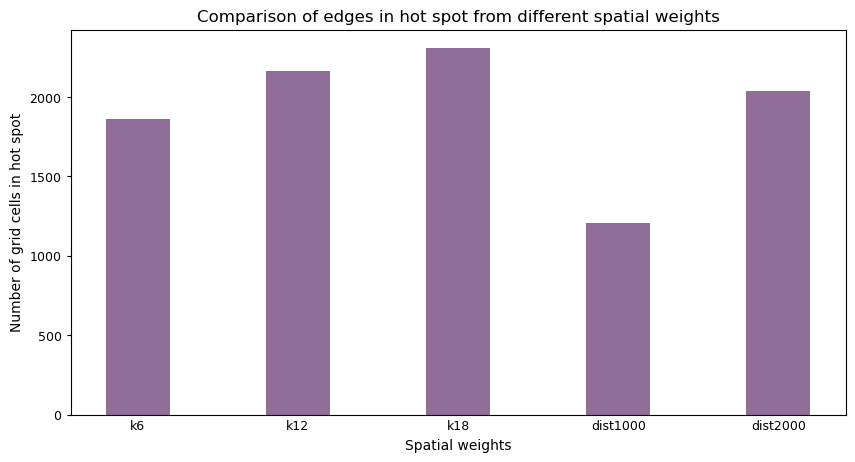

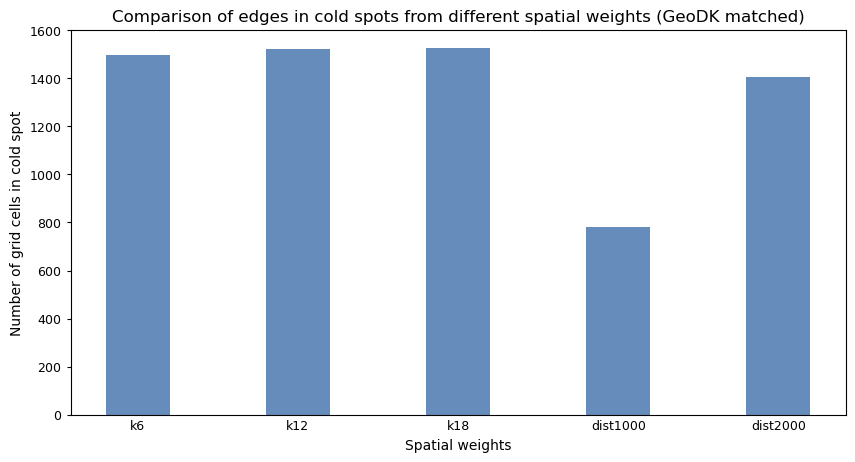

In [13]:
fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(all_morans.keys(), all_morans.values(), color="#AA336A", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Moran's I")
plt.title(
    "Comparison of global spatial autocorrelation from different spatial weights (GeoDK matched)"
)
plt.show()


fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(hotspot_count.keys(), hotspot_count.values(), color="#916E99", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Number of grid cells in hot spot")
plt.title("Comparison of edges in hot spot from different spatial weights")
plt.show()

fig = plt.figure(figsize=(10, 5))

# creating the bar plot
plt.bar(coldspot_count.keys(), coldspot_count.values(), color="#658CBB", width=0.4)

plt.xlabel("Spatial weights")
plt.ylabel("Number of grid cells in cold spot")
plt.title(
    "Comparison of edges in cold spots from different spatial weights (GeoDK matched)"
)
plt.show()

In [14]:
# read all local spatial autocorrelation results from CSV

df_k6 = pd.read_csv(
    compare_analysis_data_fp + f"geodk_matched_spatial_autocorrelation_k6.csv",
    usecols=["ref_matched_q", "grid_id"],
)
df_k6["name"] = "k6"

df_k12 = pd.read_csv(
    compare_analysis_data_fp + f"geodk_matched_spatial_autocorrelation_k12.csv",
    usecols=["ref_matched_q", "grid_id"],
)
df_k12["name"] = "k12"

df_k18 = pd.read_csv(
    compare_analysis_data_fp + f"geodk_matched_spatial_autocorrelation_k18.csv",
    usecols=["ref_matched_q", "grid_id"],
)
df_k18["name"] = "k18"

df_dist1 = pd.read_csv(
    compare_analysis_data_fp + f"geodk_matched_spatial_autocorrelation_dist1000.csv",
    usecols=["ref_matched_q", "grid_id"],
)
df_dist1["name"] = "dist1000"

df_dist2 = pd.read_csv(
    compare_analysis_data_fp + f"geodk_matched_spatial_autocorrelation_dist2000.csv",
    usecols=["ref_matched_q", "grid_id"],
)
df_dist2["name"] = "dist2000"

all_dfs = pd.concat([df_k6, df_k12, df_k18, df_dist1, df_dist2])

# group based on grid cell id

grouped = all_dfs.groupby("grid_id")

hex_classification_count = {}

# count unique quadrant classifications
for hex_id, group in grouped:
    hex_classification_count[hex_id] = len(group["ref_matched_q"].unique())

count_reclassifications = [k for k, v in hex_classification_count.items() if v > 1]

print(
    f"{len(count_reclassifications)} out of {len(grouped)} grid cells change cluster type depending on the spatial weight definition used."
)

4224 out of 7413 grid cells change cluster type depending on the spatial weight definition used.


In [15]:
all_morans

{'k6': 0.5153936838761309,
 'k12': 0.41536135759205495,
 'k18': 0.3636861653770714,
 'dist1000': 0.7027966633034907,
 'dist2000': 0.6268048473687646}